In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
from hallprobecalib.rawdataframe import RawDataFrame
from hallprobecalib.contour2d import Contour2d
from hallprobecalib import hpc_ext_path
import matplotlib.pyplot as plt
%matplotlib widget
#%matplotlib ipympl
#%matplotlib notebook
#get_ipython().run_line_magic('matplotlib', 'notebook')
plt.rcParams['figure.figsize'] = (9.0, 7.0)

In [2]:
df,meta = RawDataFrame('datafiles/2018-10-03 125726',frompickle=True)
df.columns

Index(['PS_DMM', 'X_ZAB', 'Y_ZAB', 'Z_ZAB', 'PAT_X', 'PAT_Y', 'PAT_Z',
       'BX_CAL_1', 'BY_CAL_1', 'BZ_CAL_1', 'BX_CAL_2', 'BY_CAL_2', 'BZ_CAL_2',
       'BX_RAW_1', 'BY_RAW_1', 'BZ_RAW_1', 'BX_RAW_2', 'BY_RAW_2', 'BZ_RAW_2',
       'B_MAG_CAL_1', 'B_MAG_CAL_2', 'NMR_B_AVG', 'FFT_MAX', 'TEMP_1',
       'TEMP_2', 'GRAD_B_X', 'GRAD_B_Y', 'GRAD_B_Z', 'GRAD_B_MAG'],
      dtype='object')

In [65]:
slicesx = df.X_ZAB.unique()-df.X_ZAB.median()

f,a = Contour2d(df,f='GRAD_B_MAG',coordSlice='X',posSlice=slicesx[10],cmap='viridis',cutDir='<',quantile=0.01,originCenter=True)
f,a = Contour2d(df,f='NMR_B_AVG',coordSlice='X',posSlice=slicesx[10],cmap='viridis',cutDir='<',quantile=0.01,originCenter=True)

FigureCanvasNbAgg()

FigureCanvasNbAgg()

In [3]:
# center coordinates
df["X"] = pd.Series([row.X_ZAB-df.X_ZAB.median() for row in df.itertuples()])
df["Y"] = pd.Series([row.Y_ZAB-df.Y_ZAB.median() for row in df.itertuples()])
df["Z"] = pd.Series([row.Z_ZAB-df.Z_ZAB.median() for row in df.itertuples()])

In [4]:
print(len(df.X.unique()),len(df.Y.unique()),len(df.Z.unique()))

21 41 41


In [111]:
p = df.X == 0.0
q = df[p].GRAD_B_MAG < df[p].GRAD_B_MAG.quantile(0.01)
print(f"# points: {len(df[p&q])}, range B(T): {df[p & q].NMR_B_AVG.max()-df[p & q].NMR_B_AVG.min()}")

# points: 17, range B(T): 5.408679999874266e-06


In [109]:
fig = plt.figure()
ax = fig.gca(projection="3d")
surf = ax.scatter(df[p & q].Y,df[p & q].Z,df[p & q].NMR_B_AVG,cmap=plt.get_cmap("viridis"))

/home/ckampa/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


FigureCanvasNbAgg()

X = -15625.0, # points: 168.0, range B(T): 1.3028559999961331e-05, grad Bmax: 2.2229172488483946e-08
Y: (-6835.9375, 12304.6875), Z: (-10937.5, 8203.125)
X = -14062.5, # points: 168.0, range B(T): 1.670801999975602e-05, grad Bmax: 2.062396774939483e-08
Y: (-5468.75, 12304.6875), Z: (-10937.5, 8203.125)
X = -12500.0, # points: 168.0, range B(T): 1.8033299999942187e-05, grad Bmax: 1.661349641469083e-08
Y: (-5468.75, 12304.6875), Z: (-10937.5, 8203.125)
X = -10937.5, # points: 168.0, range B(T): 1.7650840000271728e-05, grad Bmax: 1.348605096492484e-08
Y: (-6835.9375, 12304.6875), Z: (-10937.5, 8203.125)
X = -9375.0, # points: 168.0, range B(T): 2.5210300000022556e-05, grad Bmax: 1.5065957941119154e-08
Y: (-9570.3125, 8203.125), Z: (-10937.5, 8203.125)
X = -7812.5, # points: 168.0, range B(T): 2.0717880000242772e-05, grad Bmax: 1.9234918479737147e-08
Y: (-8203.125, 9570.3125), Z: (-10937.5, 8203.125)
X = -6250.0, # points: 168.0, range B(T): 3.310288000002437e-05, grad Bmax: 1.719150135252

/home/ckampa/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


X = 15625.0, # points: 168.0, range B(T): 8.503410000026967e-05, grad Bmax: 4.522410298218558e-09
Y: (-5468.75, 10937.5), Z: (-21875.0, 12304.6875)
X = -15625.0, # points: 168.0, range B(T): 1.3028559999961331e-05, grad Bmax: 2.2229172488483946e-08
Y: (-6835.9375, 12304.6875), Z: (-10937.5, 8203.125)
X = -14062.5, # points: 168.0, range B(T): 1.670801999975602e-05, grad Bmax: 2.062396774939483e-08
Y: (-5468.75, 12304.6875), Z: (-10937.5, 8203.125)
X = -12500.0, # points: 168.0, range B(T): 1.8033299999942187e-05, grad Bmax: 1.661349641469083e-08
Y: (-5468.75, 12304.6875), Z: (-10937.5, 8203.125)
X = -10937.5, # points: 168.0, range B(T): 1.7650840000271728e-05, grad Bmax: 1.348605096492484e-08
Y: (-6835.9375, 12304.6875), Z: (-10937.5, 8203.125)
X = -9375.0, # points: 168.0, range B(T): 2.5210300000022556e-05, grad Bmax: 1.5065957941119154e-08
Y: (-9570.3125, 8203.125), Z: (-10937.5, 8203.125)
X = -7812.5, # points: 168.0, range B(T): 2.0717880000242772e-05, grad Bmax: 1.92349184797371

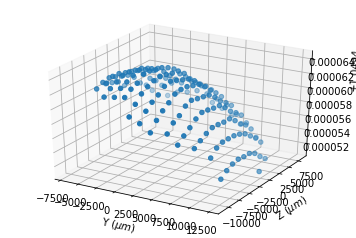

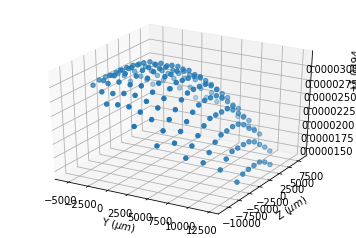

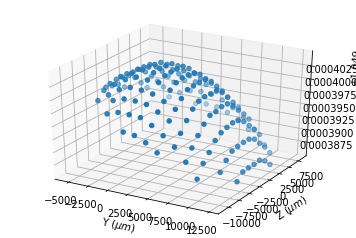

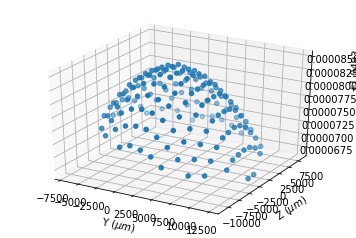

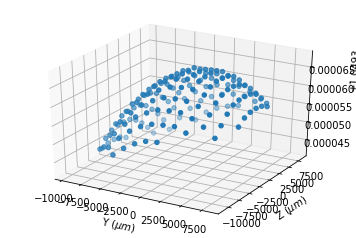

...

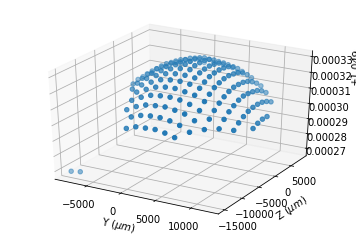

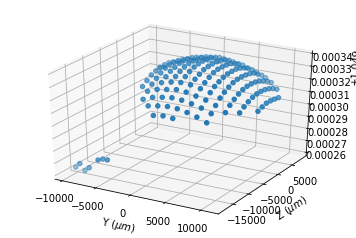

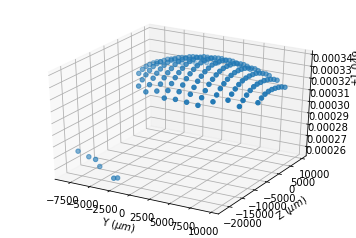

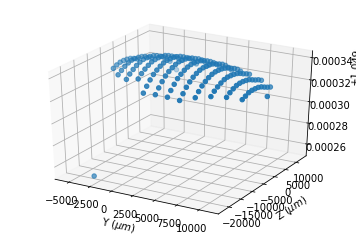

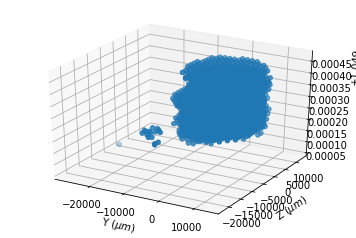

In [6]:
#qu = 0.01
qu = 0.1
slicesx = df.X.unique()
num = np.array([])
r_B = np.array([])
pstring= []

YS = np.array([])
ZS = np.array([])
BS = np.array([])

for x in slicesx:
    fig = plt.figure()
    ax = fig.gca(projection="3d")
    p = df.X == x
    q = df[p].GRAD_B_MAG < df[p].GRAD_B_MAG.quantile(qu)
    ax.scatter(df[p & q].Y,df[p & q].Z,df[p & q].NMR_B_AVG,cmap=plt.get_cmap("viridis"))
    plt.xlabel(r"Y ($\mu m$)")
    plt.ylabel(r"Z ($\mu m$)")
    num = np.append(num,len(df[p & q]))
    r_B = np.append(r_B,df[p & q].NMR_B_AVG.max()-df[p & q].NMR_B_AVG.min())
    pstring.append(f"X = {x}, # points: {num[-1]}, range B(T): {r_B[-1]}, grad Bmax: {df[p].GRAD_B_MAG.quantile(qu)}"
                   f"\nY: ({df[p&q].Y.min()}, {df[p&q].Y.max()}), Z: ({df[p&q].Z.min()}, {df[p&q].Z.max()})")
    print(pstring[-1])
    
    YS = np.append(YS,np.array(df[p&q].Y))
    ZS = np.append(ZS,np.array(df[p&q].Z))
    BS = np.append(BS,np.array(df[p&q].NMR_B_AVG))
    
for p in pstring:
    print(p)

fig = plt.figure()
ax = fig.gca(projection="3d")
ax.scatter(YS,ZS,BS,cmap=plt.get_cmap("viridis"))
plt.xlabel(r"Y ($\mu m$)")
plt.ylabel(r"Z ($\mu m$)")
num = len(YS)
r_B = max(BS)-min(BS)
pstring = f"# points: {num}, range B(T): {r_B}\nY: ({min(YS)}, {max(YS)}), Z: ({min(ZS)}, {max(ZS)})"
print(pstring)

In [18]:
slicesx = df.X_ZAB.unique()-df.X_ZAB.median()

for s in slicesx:
    f,a = Contour2d(df,f='GRAD_B_MAG',coordSlice='X',posSlice=s,cmap='viridis',cutDir='<',quantile=0.05,originCenter=True)

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

FigureCanvasNbAgg()

/home/ckampa/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


FigureCanvasNbAgg()

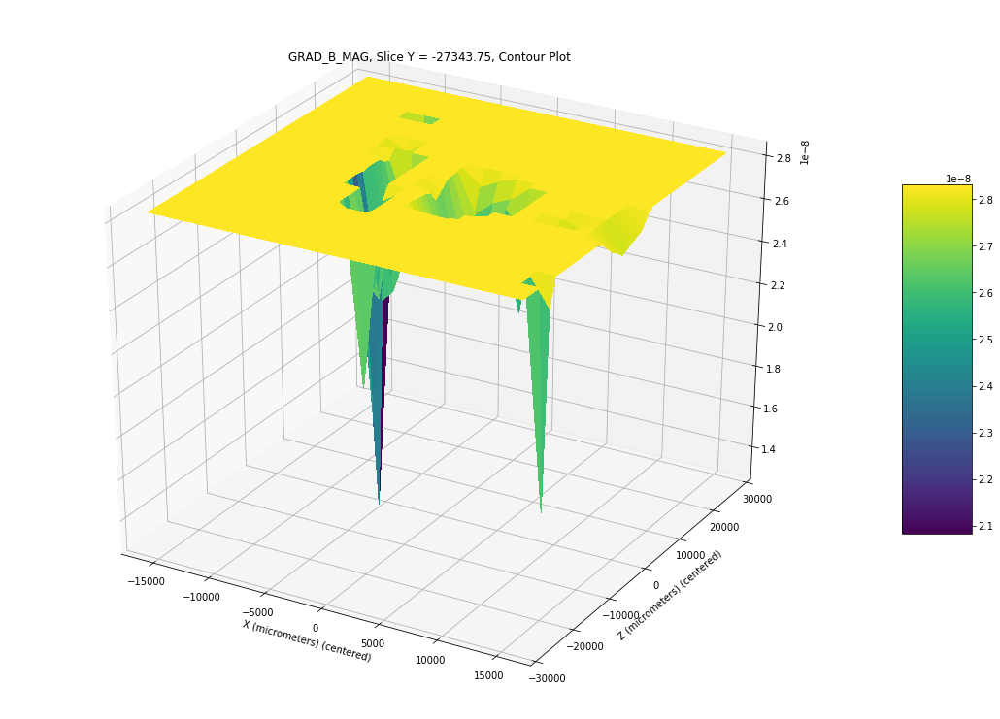

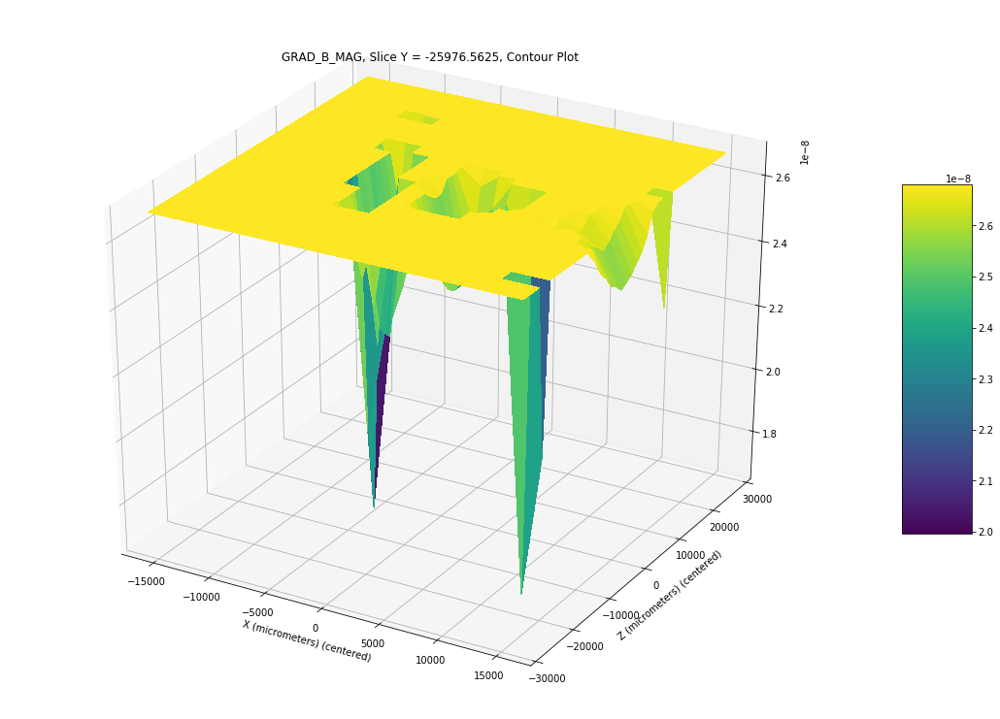

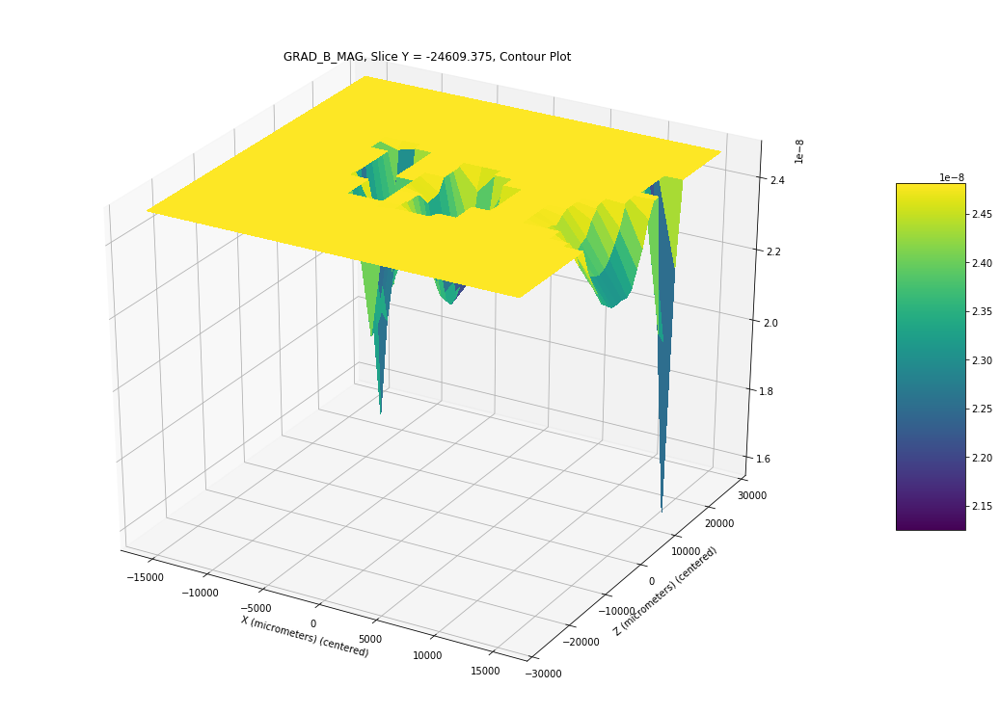

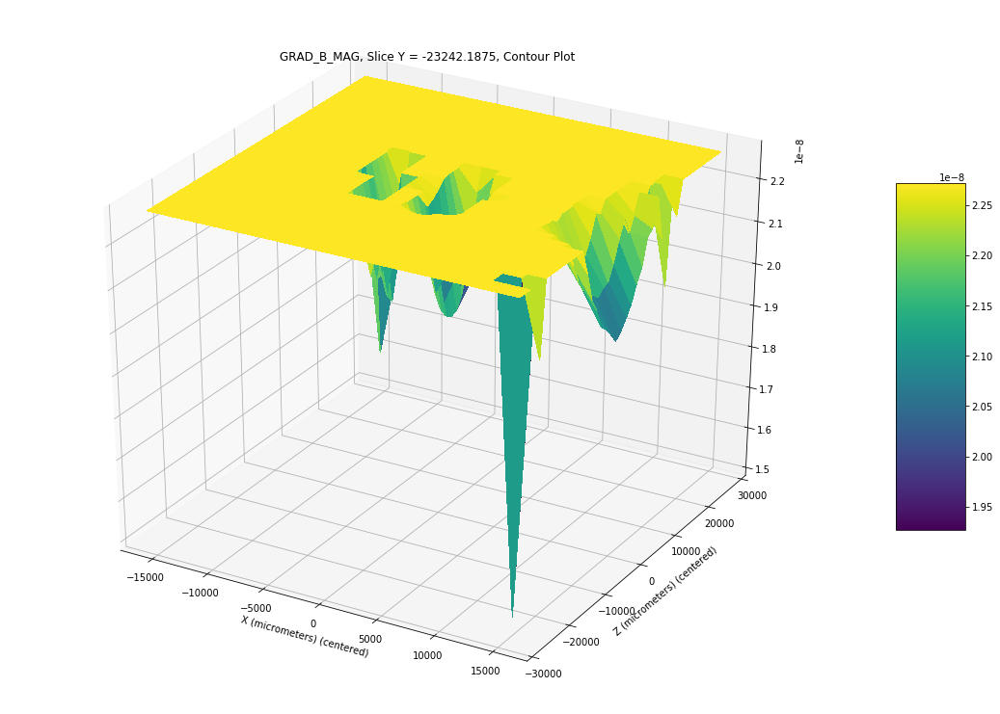

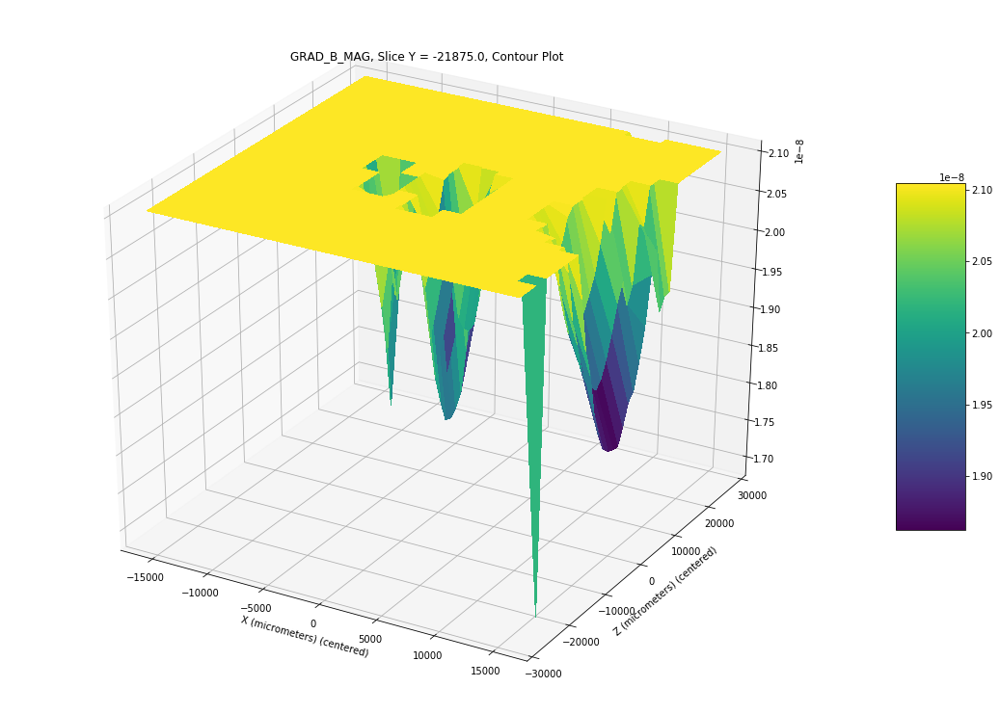

...

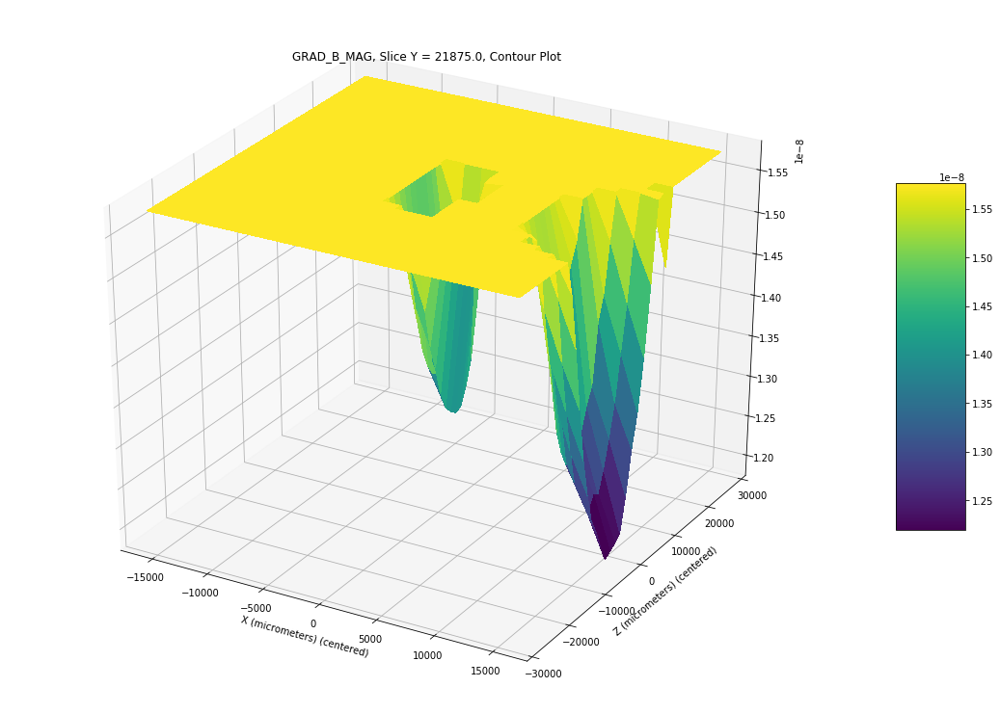

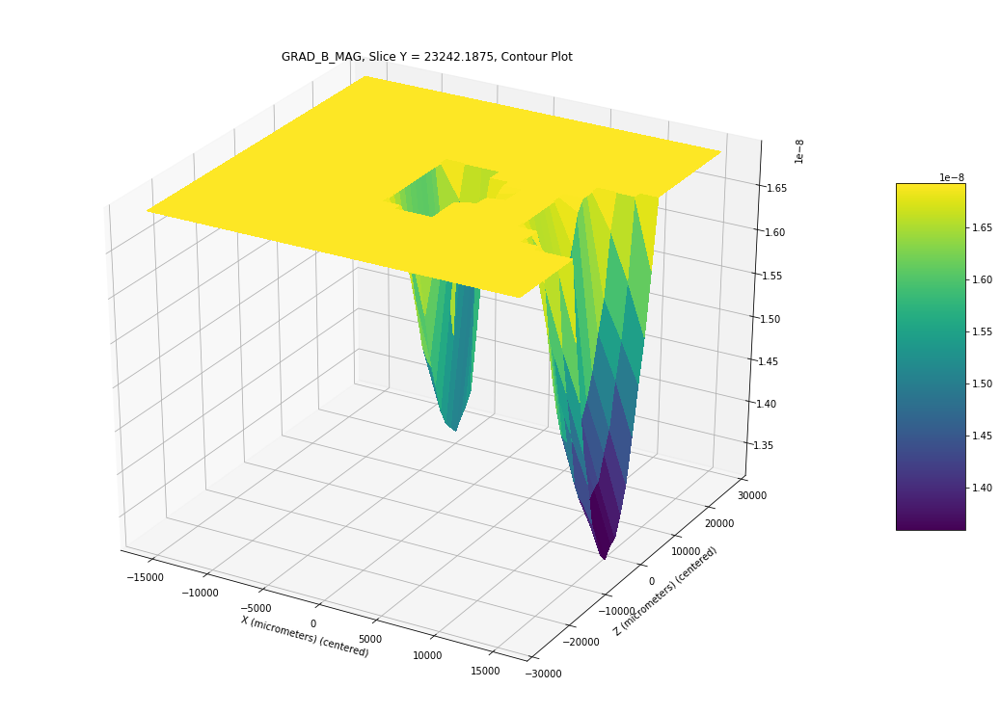

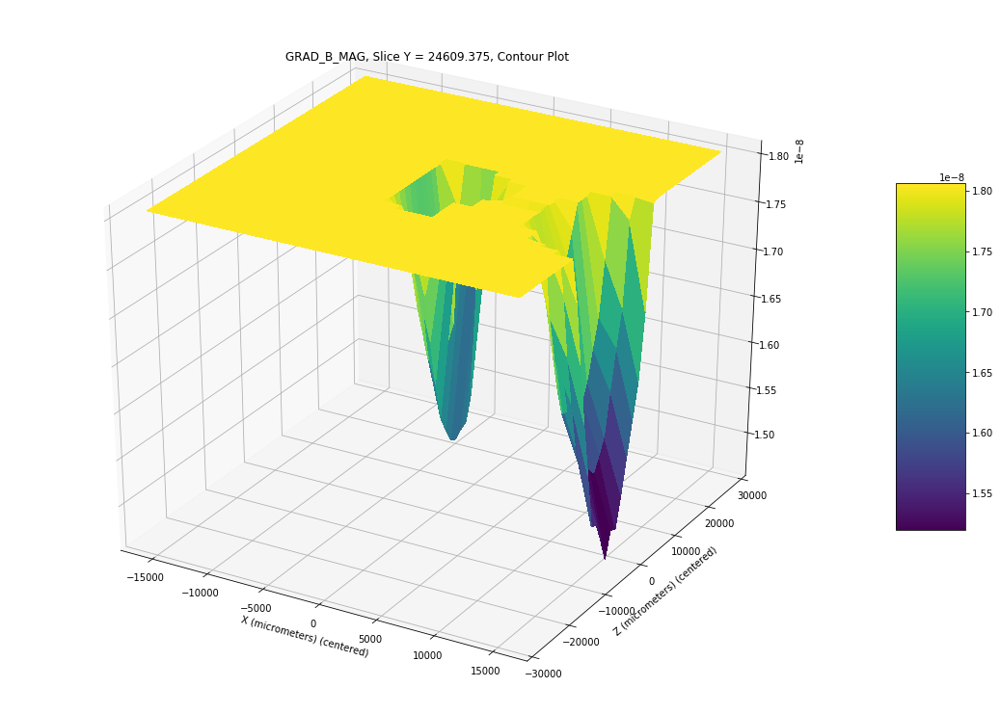

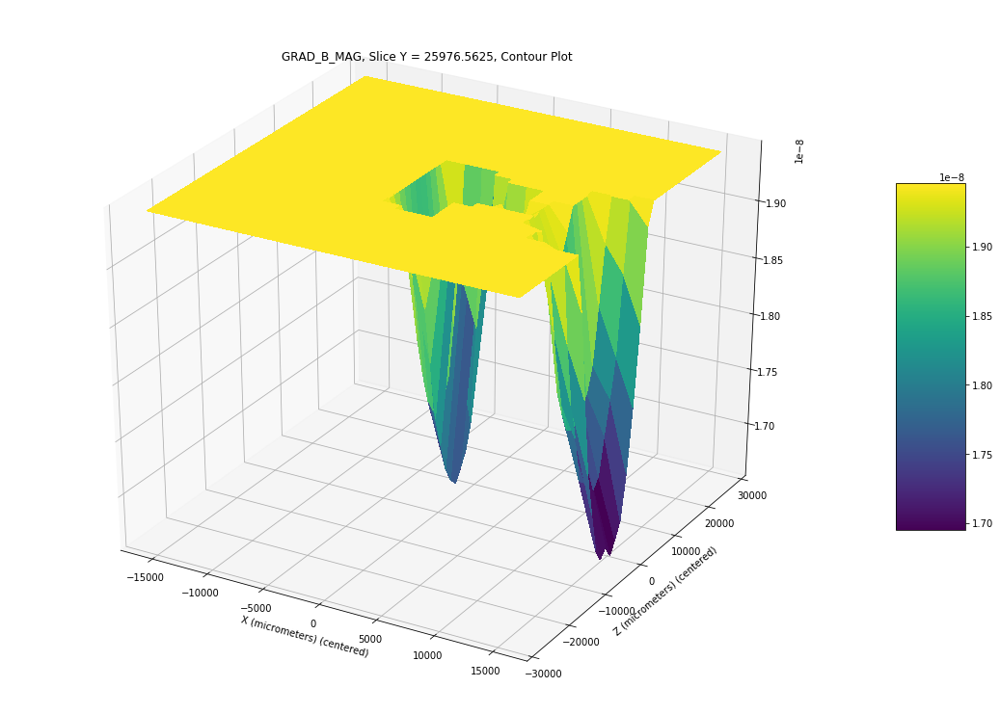

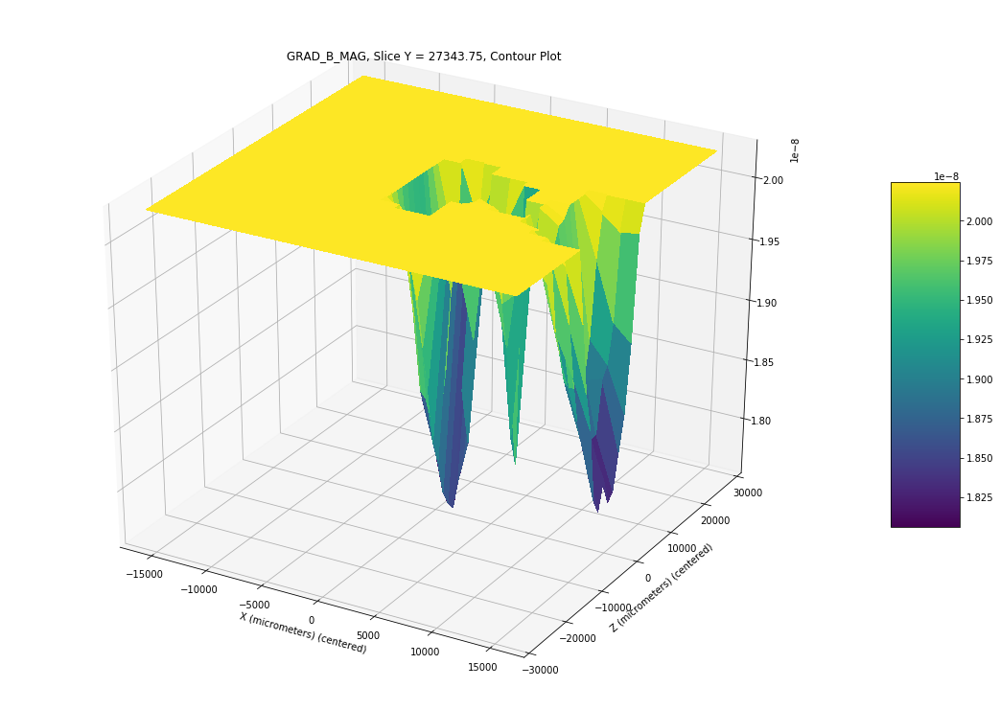

In [11]:
slicesy = df.Y_ZAB.unique()-df.Y_ZAB.median()

for s in slicesy:
    f,a = Contour2d(df,f='GRAD_B_MAG',coordSlice='Y',posSlice=s,cmap='viridis',cutDir='<',quantile=0.1,originCenter=True)

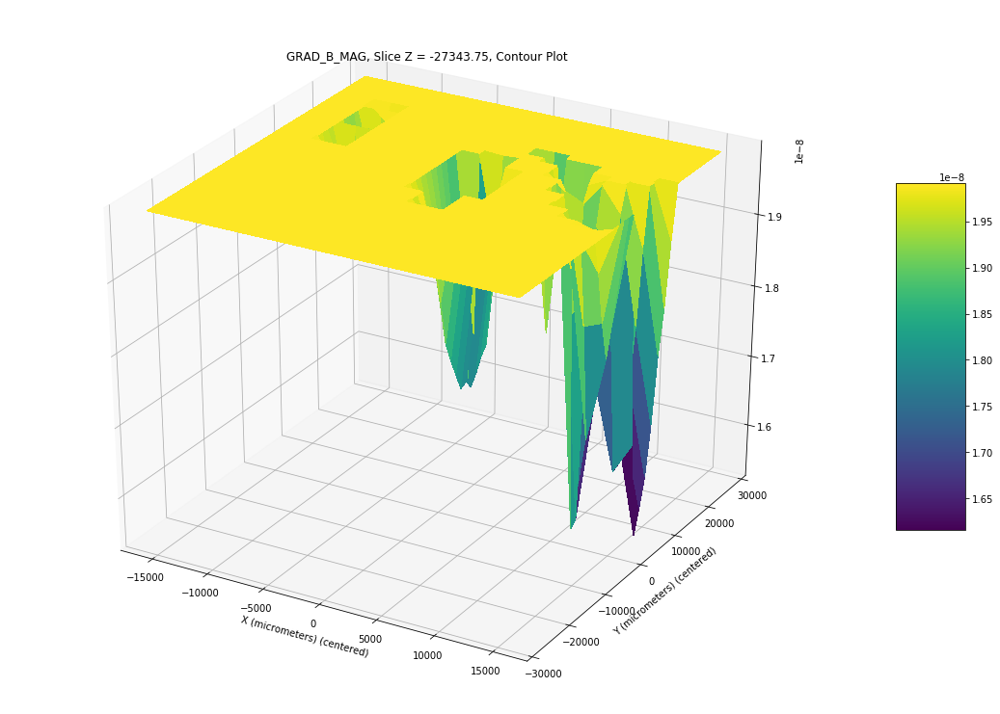

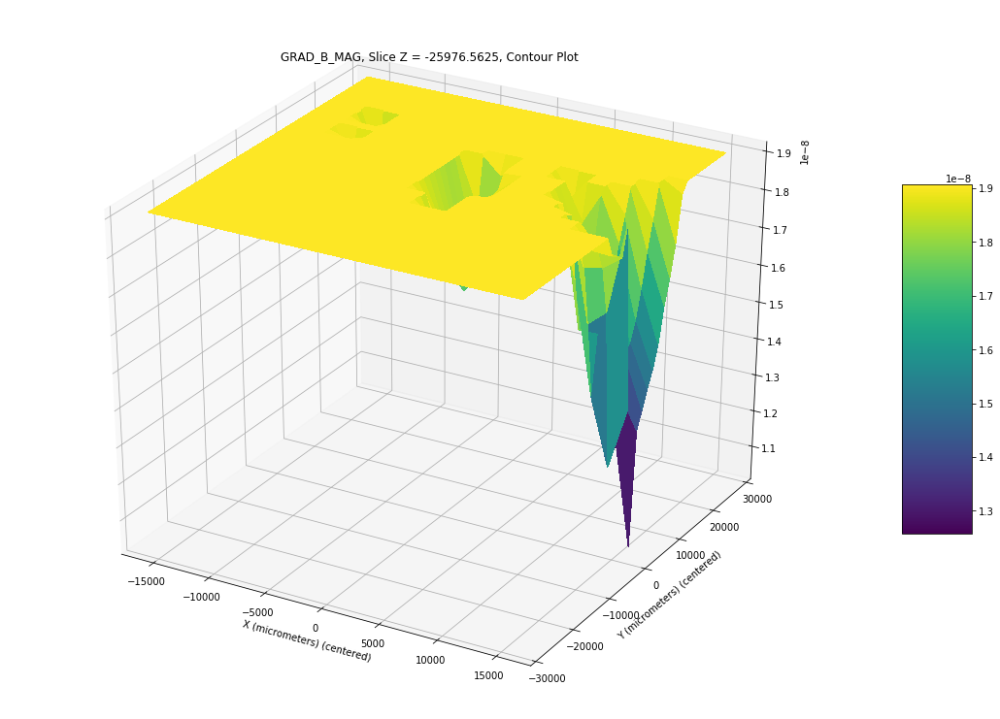

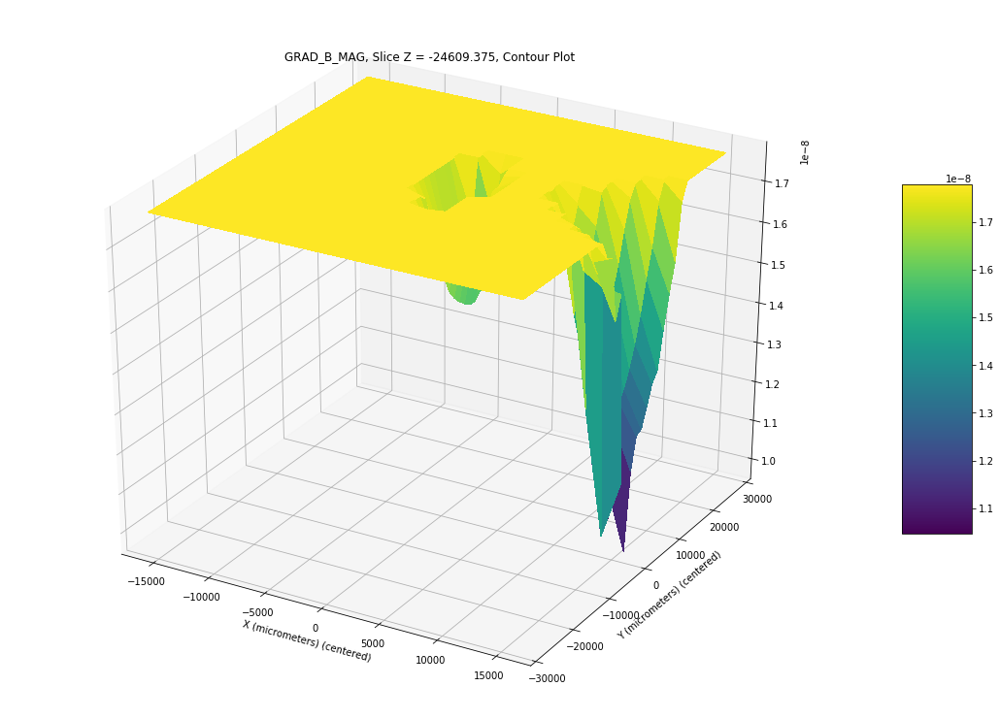

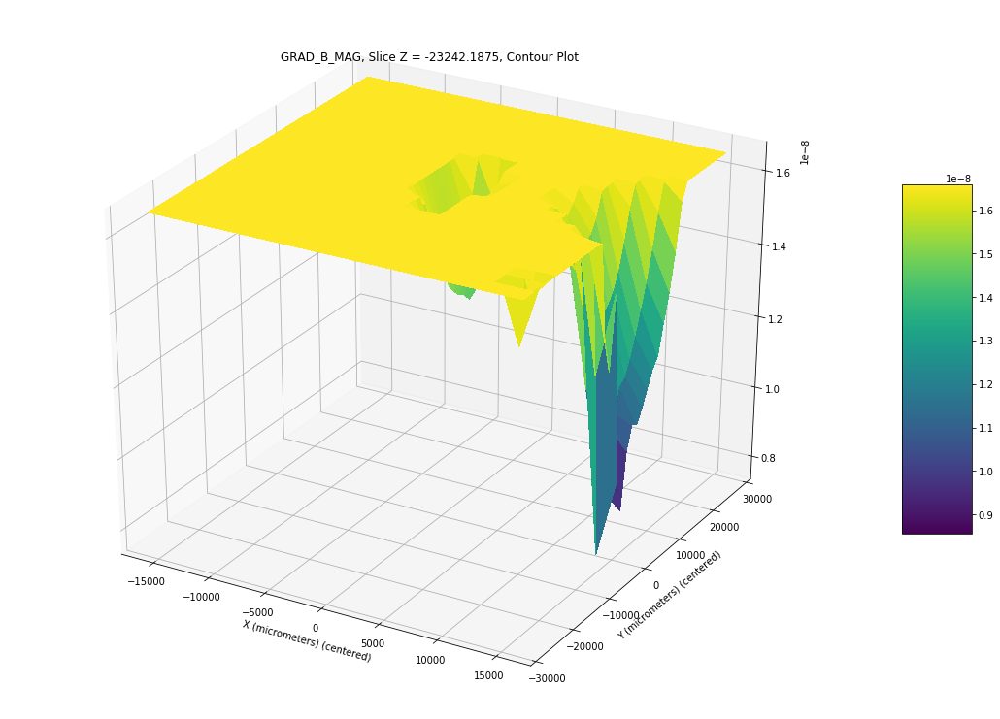

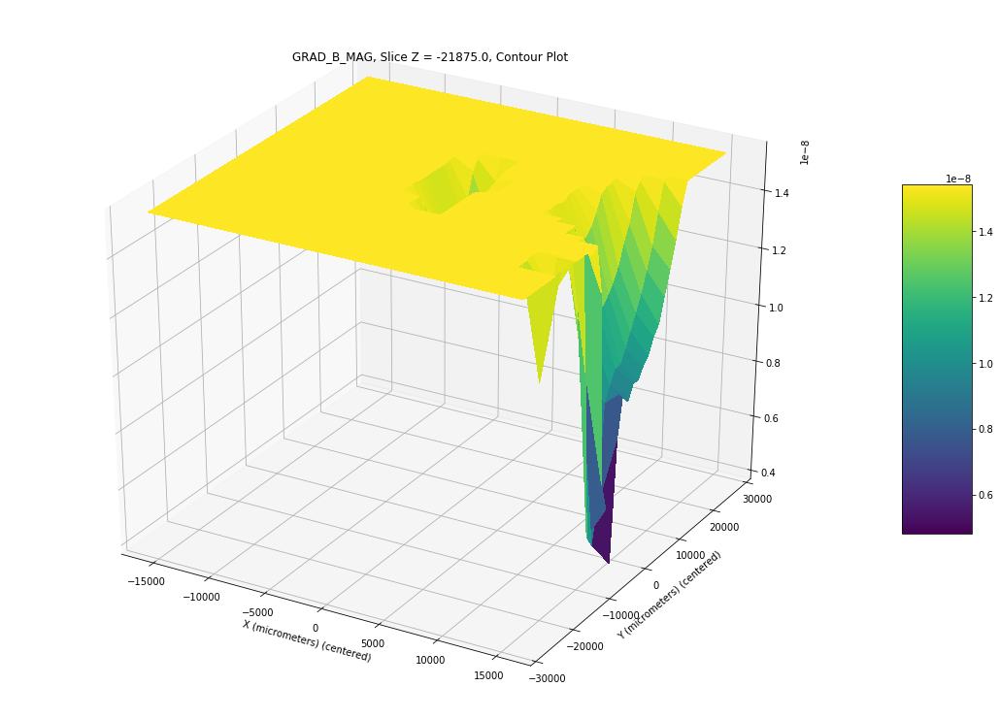

...

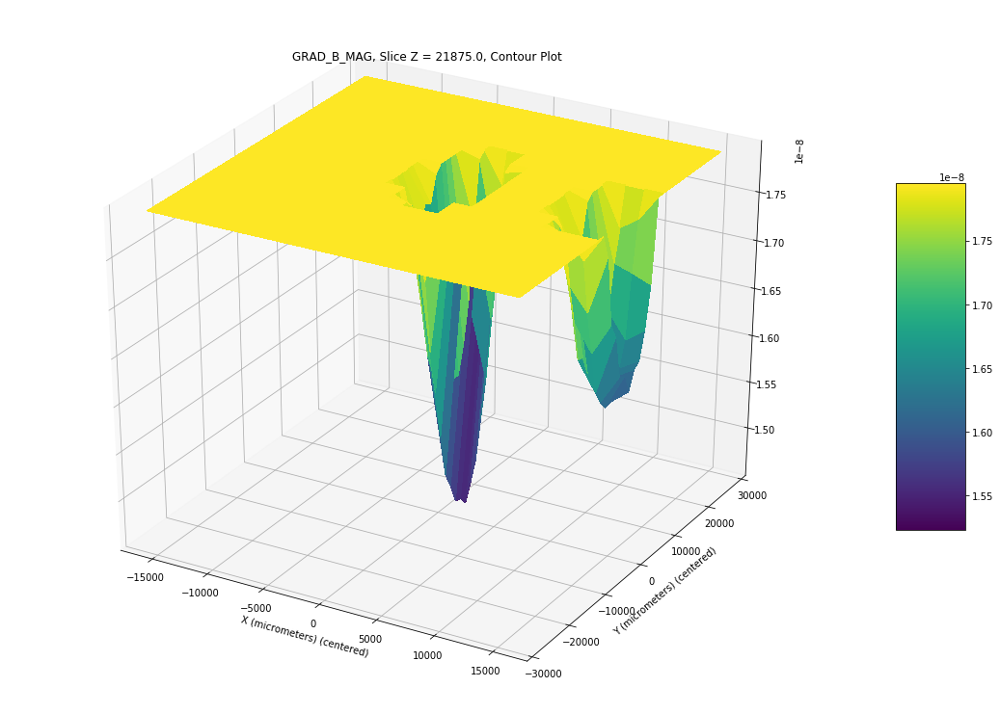

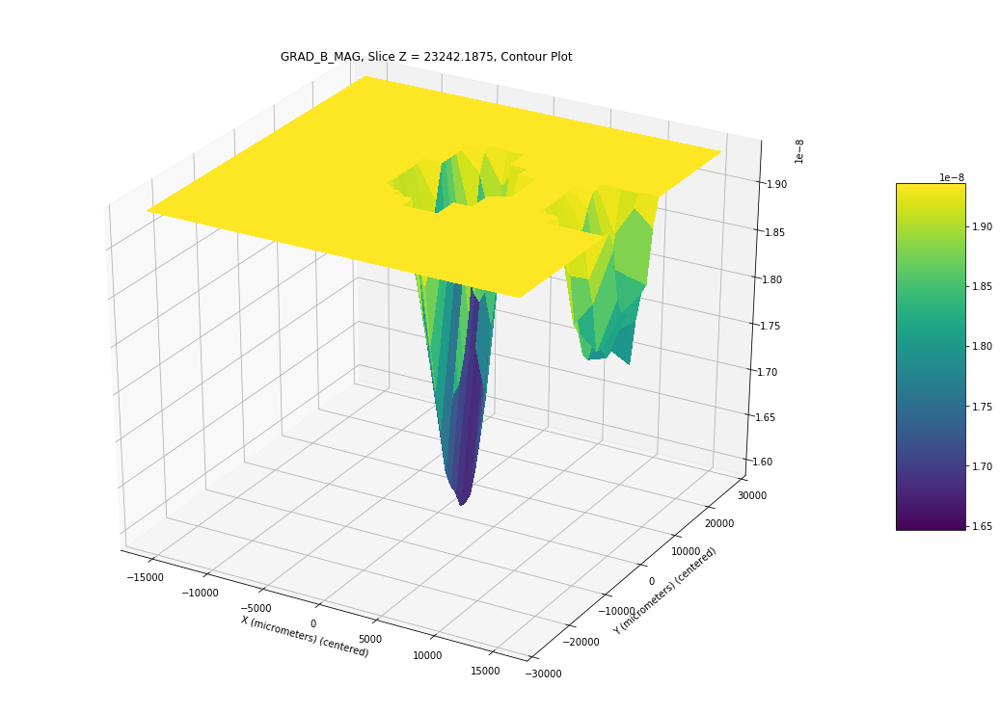

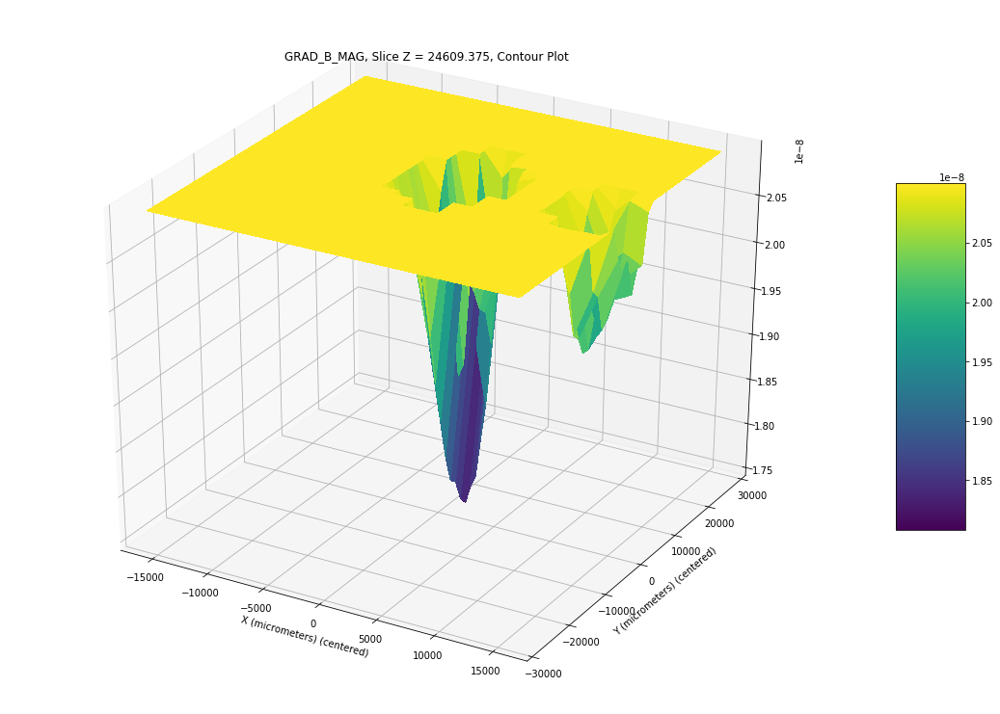

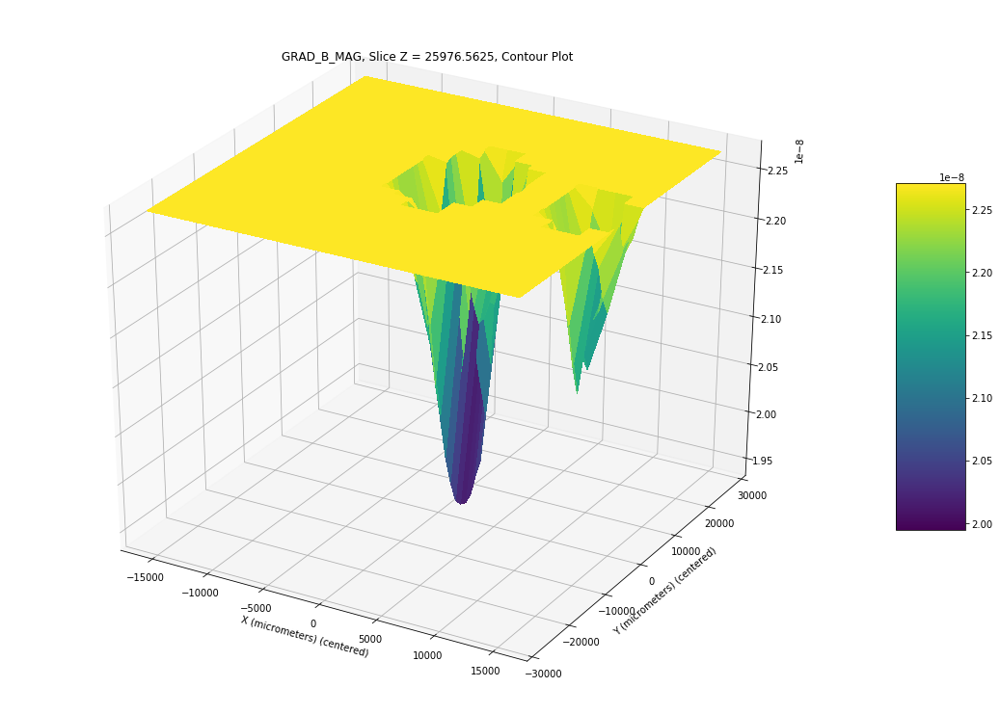

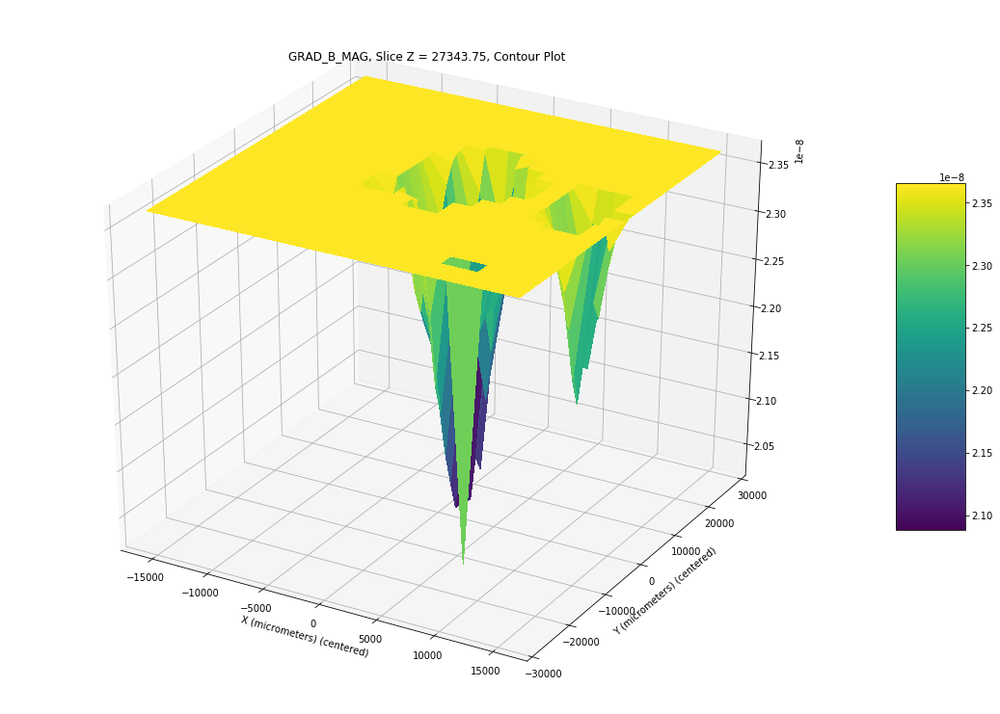

In [12]:
slicesz = df.Z_ZAB.unique()-df.Z_ZAB.median()

for s in slicesz:
    f,a = Contour2d(df,f='GRAD_B_MAG',coordSlice='Z',posSlice=s,cmap='viridis',cutDir='<',quantile=0.1,originCenter=True)

In [12]:
# centered coordinate ranges and step sizes ALL IN MICROMETERS
xs = df.X_ZAB.unique()-df.X_ZAB.median()
ys = df.Y_ZAB.unique()-df.Y_ZAB.median()
zs = df.Z_ZAB.unique()-df.Z_ZAB.median()

In [15]:
print(f"{xs.min()} <= X <= {xs.max()}")
print(f"{ys.min()} <= Y <= {ys.max()}")
print(f"{zs.min()} <= Z <= {zs.max()}")

-15625.0 <= X <= 15625.0
-27343.75 <= Y <= 27343.75
-27343.75 <= Z <= 27343.75


In [18]:
print(f"X Step: {xs[1]-xs[0]}")
print(f"Y Step: {ys[1]-ys[0]}")
print(f"Z Step: {zs[1]-zs[0]}")

X Step: 1562.5
Y Step: 1367.1875
Z Step: 1367.1875


In [19]:
print(f"Xs: {len(xs)}")
print(f"Ys: {len(ys)}")
print(f"Zs: {len(zs)}")

Xs: 21
Ys: 41
Zs: 41


In [23]:
# grid size cm^3
2*14625/1000*2*27343.75/1000*2*27343.75/1000/1e3

87.4786376953125

In [27]:
df.describe()

,X_ZAB,Y_ZAB,Z_ZAB,PAT_X,PAT_Y,PAT_Z,BX_CAL_1,BY_CAL_1,BZ_CAL_1,BX_CAL_2,BY_CAL_2,BZ_CAL_2,BX_RAW_1,BY_RAW_1,BZ_RAW_1,BX_RAW_2,BY_RAW_2,BZ_RAW_2,B_MAG_CAL_1,B_MAG_CAL_2,NMR_B_AVG,FFT_MAX,TEMP_1,TEMP_2,GRAD_B_X,GRAD_B_Y,GRAD_B_Z,GRAD_B_MAG
count,35301.00000,35301.000000,35301.000000,35301.000000,35301.000000,3.530100e+04,35301.000000,35301.000000,3.530100e+04,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,35301.000000,3.530100e+04,3.530100e+04,3.530100e+04,3.530100e+04
mean,144531.25000,175781.250000,503906.250000,370000.000000,450000.000000,1.290000e+06,0.000062,0.000130,-1.965100e-07,-0.000293,0.000123,0.000032,-825.075579,4929.788816,37.720999,4995.768307,1794.212459,458.865018,0.000147,0.000321,1.049191,62.200494,23.879317,24.011595,-6.351784e-09,1.579655e-09,-8.713823e-10,2.238449e-08
std,9461.54137,16177.009788,16177.009788,24221.545907,41413.145058,4.141315e+04,0.000019,0.000024,1.948622e-05,0.000031,0.000023,0.000022,82.512475,319.358651,54.246134,327.077375,67.674224,60.917323,0.000024,0.000029,0.000142,27.953161,1.603018,0.673180,1.815048e-08,1.197919e-08,9.747525e-09,1.051078e-08
min,128906.25000,148437.500000,476562.500000,330000.000000,380000.000000,1.220000e+06,-0.000008,-0.000287,-8.378200e-05,-0.002116,0.000000,-0.000068,-1675.000000,0.000000,-195.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.048506,7.262182,0.000000,22.772000,-7.267882e-08,-5.712229e-08,-5.635100e-08,1.014697e-09
25%,136718.75000,162109.375000,490234.375000,350000.000000,415000.000000,1.255000e+06,0.000050,0.000115,-1.320700e-05,-0.000308,0.000108,0.000018,-869.000000,4916.000000,1.000000,4978.000000,1758.000000,419.000000,0.000132,0.000306,1.049108,40.428307,23.358000,23.370000,-2.090430e-08,-6.143393e-09,-6.997051e-09,1.493759e-08
50%,144531.25000,175781.250000,503906.250000,370000.000000,450000.000000,1.290000e+06,0.000062,0.000129,-3.770000e-07,-0.000294,0.000123,0.000032,-826.000000,4950.000000,37.000000,5017.000000,1796.000000,458.000000,0.000146,0.000321,1.049208,58.517830,24.180000,24.219000,-7.645101e-09,6.068517e-10,-4.926683e-10,2.096010e-08
75%,152343.75000,189453.125000,517578.125000,390000.000000,485000.000000,1.325000e+06,0.000075,0.000145,1.268600e-05,-0.000281,0.000138,0.000046,-786.000000,4984.000000,74.000000,5055.000000,1834.000000,498.000000,0.000162,0.000337,1.049289,81.527420,24.459000,24.529000,1.026079e-08,8.682481e-09,5.426205e-09,2.831951e-08
max,160156.25000,203125.000000,531250.000000,410000.000000,520000.000000,1.360000e+06,0.000270,0.000440,9.139400e-05,0.000000,0.000232,0.000687,314.000000,5146.000000,292.000000,5253.000000,2070.000000,740.000000,0.000446,0.002119,1.049464,145.718811,24.853000,24.946000,1.201084e-07,6.674347e-08,3.332040e-08,1.220716e-07


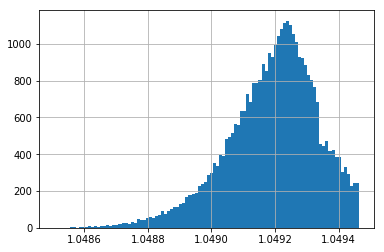

In [28]:
df.NMR_B_AVG.hist(bins=100)

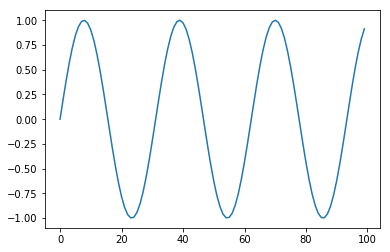

In [5]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(1)
plt.plot(np.sin(np.linspace(0, 20, 100)))
plt.show()

In [6]:
from ipywidgets import widgets
from IPython.display import display